In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import sys
import os
from pathlib import Path

In [4]:
BASE_PATH = Path(os.path.abspath('')).parent.parent.parent
sys.path.append(str(BASE_PATH))

In [5]:
import matplotlib.pyplot as plt
import pandas as pd
import datetime
import numpy as np

import matplotlib.pyplot as plt
import scienceplots

%matplotlib inline

# plt.style.use(['science','ieee'])
# plt.style.use(['science','nature'])

In [6]:
old_portfolio = pd.read_csv('sp_portfolio_2024_07_01.csv')
old_portfolio = old_portfolio.fillna(0.)
old_portfolio["Date"] = pd.to_datetime(old_portfolio["Date"], utc=True).dt.date
old_portfolio = old_portfolio.set_index("Date")
old_portfolio

,AAPL,ABBV,ABT,ACN,ADBE,AMD,AMZN,AVGO,BAC,CAT,...,PG,QCOM,TMO,TSLA,UBER,UNH,VZ,WFC,WMT,XOM
Date,,,,,,,,,,,,,,,,,,,,,
2020-04-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2020-04-02,0.016549,0.023023,0.036797,0.010227,0.009088,0.018832,0.005817,0.058320,0.039668,0.047271,...,0.045330,0.031663,0.043899,-0.057899,-0.070905,0.013061,0.043087,0.024169,0.038753,0.073689
2020-04-03,-0.014476,-0.023705,0.000126,-0.026719,-0.034644,-0.043645,-0.006399,-0.011882,-0.026602,-0.017891,...,0.005926,-0.041882,-0.018746,0.054675,-0.036993,-0.046611,-0.010005,-0.037048,0.006971,-0.029898
2020-04-06,0.083640,0.031659,0.040454,0.087422,0.083346,0.109531,0.046625,0.074742,0.065692,0.049010,...,0.023446,0.084056,0.074376,0.072765,0.130075,0.078939,0.035910,0.087551,0.053688,0.031629
2020-04-07,-0.011650,-0.004500,-0.009717,-0.011691,-0.032484,0.000841,0.006989,0.003283,0.034462,0.012297,...,-0.043723,0.024778,-0.024711,0.055039,-0.009666,-0.001209,0.004926,0.004878,-0.032898,0.018847
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-06-24,0.003128,0.013698,-0.003981,-0.005745,-0.017531,-0.006097,-0.018738,-0.037699,0.013332,0.006567,...,0.001129,-0.056575,0.002388,-0.002352,0.004689,0.015197,0.022848,0.015541,0.014473,0.029271
2024-06-25,0.004458,-0.011587,0.001803,-0.000130,0.005157,0.000000,0.004141,-0.007198,-0.016121,-0.007910,...,-0.009544,0.006600,-0.016803,0.025790,0.011838,-0.011247,-0.002188,-0.031153,-0.021715,0.002802
2024-06-26,0.019796,0.002340,-0.005799,-0.008336,0.003373,-0.017056,0.038273,0.007066,-0.009696,-0.002048,...,0.003590,-0.024231,0.002960,0.047022,-0.007453,-0.000950,-0.001462,-0.003327,0.012822,0.000350


In [7]:
portfolio = pd.read_csv('sp_portfolio_2025_01_12.csv')
portfolio = portfolio.fillna(0.)
portfolio["Date"] = pd.to_datetime(portfolio["Date"], utc=True)#.dt.date
# portfolio = portfolio[portfolio.Date <= datetime.date(2024, 8, 2)]
portfolio = portfolio.set_index("Date")
portfolio = portfolio.astype(float)
# portfolio = portfolio.drop(columns=['TIA-USD', 'OP-USD', 'UNI-USD', 'ARB-USD', 'SHIB-USD'], axis=1)
portfolio = portfolio[old_portfolio.columns]
portfolio = portfolio[portfolio.mean().sort_values(ascending=False).index]

In [15]:
monthly_portfolio = portfolio.resample("M").sum()
monthly_portfolio_std = portfolio.resample("M").std()

returns = pd.DataFrame(monthly_portfolio.mean(), columns=["Return"])
risk = pd.DataFrame(monthly_portfolio_std.std(), columns=["Risk"])

df_risk_return = returns.merge(risk, left_index=True, right_index=True)

/var/folders/pr/c2dbtqtn2td9ylt9lvrqnrxc0000gn/T/ipykernel_60386/957110852.py:1: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_portfolio = portfolio.resample("M").sum()
/var/folders/pr/c2dbtqtn2td9ylt9lvrqnrxc0000gn/T/ipykernel_60386/957110852.py:2: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_portfolio_std = portfolio.resample("M").std()


In [16]:
import numpy as np

# Generate LaTeX table
table = "\\begin{table}[h]\n"
table += "\\centering\n"
table += "\\begin{tabular}{lcc}\n"
table += "\\hline\n"
table += "Stock Symbol & Mean Daily Returns $\\pm$ Daily Risk \\\\\n"
table += "\\hline\n"
for i in range (len(df_risk_return.index)):
    ticker=df_risk_return.index[i]
    x=df_risk_return.loc[ticker, "Risk"]
    y=df_risk_return.loc[ticker, "Return"]
    table += f"{ticker} & ${y:.3f} \\pm {x:.3f}$ \\\\\n"
table += "\\hline\n"
table += "\\end{tabular}\n"
table += "\\caption{Stocks Daily Risks and Returns}\n"
table += "\\end{table}\n"

print(table)


\begin{table}[h]
\centering
\begin{tabular}{lcc}
\hline
Stock Symbol & Mean Daily Returns $\pm$ Daily Risk \\
\hline
NVDA & $0.039 \pm 0.012$ \\
TSLA & $0.034 \pm 0.014$ \\
AMD & $0.028 \pm 0.011$ \\
LLY & $0.028 \pm 0.008$ \\
AVGO & $0.028 \pm 0.011$ \\
AAPL & $0.021 \pm 0.008$ \\
COST & $0.020 \pm 0.006$ \\
MSFT & $0.020 \pm 0.008$ \\
NFLX & $0.017 \pm 0.013$ \\
INTU & $0.017 \pm 0.010$ \\
ORCL & $0.015 \pm 0.009$ \\
AMZN & $0.015 \pm 0.008$ \\
GOOG & $0.015 \pm 0.007$ \\
GOOGL & $0.015 \pm 0.007$ \\
META & $0.014 \pm 0.012$ \\
WMT & $0.014 \pm 0.007$ \\
CRM & $0.013 \pm 0.010$ \\
LIN & $0.013 \pm 0.007$ \\
DHR & $0.013 \pm 0.006$ \\
QCOM & $0.013 \pm 0.010$ \\
TMO & $0.012 \pm 0.007$ \\
JPM & $0.012 \pm 0.010$ \\
CAT & $0.011 \pm 0.007$ \\
UNH & $0.011 \pm 0.009$ \\
ACN & $0.011 \pm 0.008$ \\
ABBV & $0.010 \pm 0.008$ \\
ADBE & $0.010 \pm 0.010$ \\
MRK & $0.010 \pm 0.006$ \\
ABT & $0.009 \pm 0.007$ \\
PG & $0.009 \pm 0.006$ \\
GE & $0.009 \pm 0.010$ \\
IBM & $0.009 \pm 0.007$ \\
CSCO

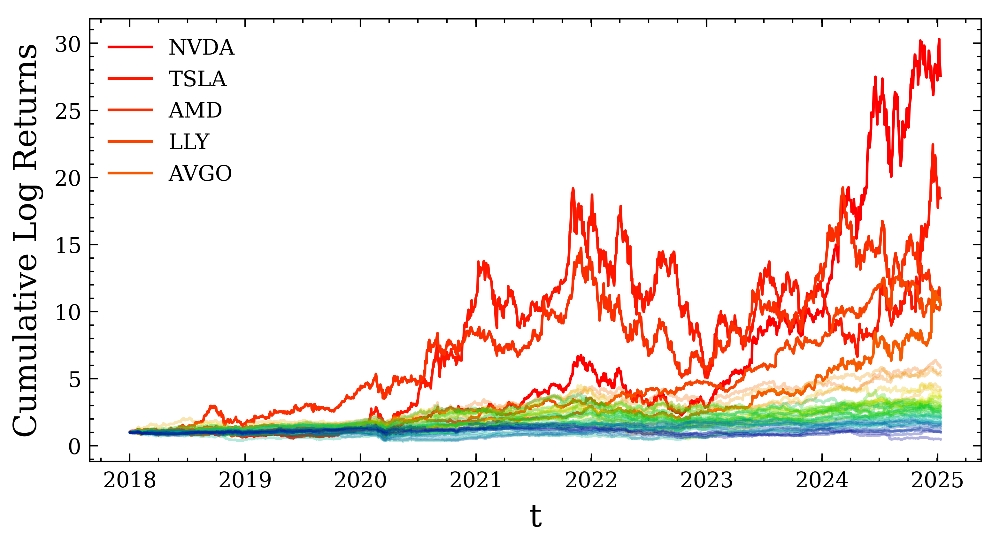

In [96]:
from colour import Color

blue = Color("red", luminance=0.5)
colors = list(blue.range_to(Color("blue", luminance=0.3), len(portfolio.columns)))

with plt.style.context(['science', 'ieee', 'no-latex']):
    fig, ax = plt.subplots(figsize=(6, 3))
    i = 0
    for col in portfolio.columns:
        if i <=4 :
            plt.plot(np.exp(portfolio[col].cumsum()), color=colors[i].rgb, linestyle="-", label=col)
        else:
            plt.plot(np.exp(portfolio[col].cumsum()), color=colors[i].rgb, alpha=0.3, linestyle="-", label=None)
        i += 1
    plt.legend()
    plt.xlabel('t', fontsize=12)
    plt.ylabel('Cumulative Log Returns', fontsize=12)
    plt.savefig('01_classes_highlighting_stocks.jpg', dpi=600)

## 1- Investigating the effect of discount (gamma) in d TS

In [18]:
gamma_vec = np.linspace(0., 1.0, 11)

In [19]:
gamma_vec

array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ])

In [21]:
gamma_hyper_policies = {
    f"D TS {i}": {
        "policy_name": "BetaDiscountedThompsonSampling",
        "args": {"n_arms": portfolio.shape[1], "gamma": gamma_vec[i]},
        "agents": [],
    }
    for i in range(len(gamma_vec))
}
gamma_hyper_policies.update(
    {   
        f"ADTS (min) {i}": {
            "policy_name": "AdaptiveDiscountedThompsonSampling",
            "args": {"n_arms": portfolio.shape[1], "gamma": gamma_vec[i], "f": "min", "w": 50},
            "agents": [],
        }
        for i in range(len(gamma_vec))
    }
)
gamma_hyper_policies.update(
    {   
        f"ADTS (mean) {i}": {
            "policy_name": "AdaptiveDiscountedThompsonSampling",
            "args": {"n_arms": portfolio.shape[1], "gamma": gamma_vec[i], "f": "mean", "w": 50},
            "agents": [],
        }
        for i in range(len(gamma_vec))
    }
)
gamma_hyper_policies.update(
    {   
        f"ADTS (max) {i}": {
            "policy_name": "AdaptiveDiscountedThompsonSampling",
            "args": {"n_arms": portfolio.shape[1], "gamma": gamma_vec[i], "f": "max", "w": 50},
            "agents": [],
        }
        for i in range(len(gamma_vec))
    }
)
gamma_hyper_policies.update(
    {   
        f"FDSWTS (min) {i}": {
            "policy_name": "CavenaghiFDSWTS",
            "args": {"n_arms": portfolio.shape[1], "gamma": gamma_vec[i], "f": "min", "n": 50},
            "agents": [],
        }
        for i in range(len(gamma_vec))
    }
)
gamma_hyper_policies.update(
    {   
        f"FDSWTS (mean) {i}": {
            "policy_name": "CavenaghiFDSWTS",
            "args": {"n_arms": portfolio.shape[1], "gamma": gamma_vec[i], "f": "mean", "n": 50},
            "agents": [],
        }
        for i in range(len(gamma_vec))
    }
)
gamma_hyper_policies.update(
    {   
        f"FDSWTS (max) {i}": {
            "policy_name": "CavenaghiFDSWTS",
            "args": {"n_arms": portfolio.shape[1], "gamma": gamma_vec[i], "f": "max", "n": 50},
            "agents": [],
        }
        for i in range(len(gamma_vec))
    }
)
# gamma_hyper_policies.update(
#     {   
#         f"Classical TS {i}": {
#             "policy_name": "ThompsonSampling",
#             "args": {"n_arms": portfolio.shape[1]},
#             "agents": [],
#         }
#         for i in range(len(gamma_vec))
#     }
# )

In [22]:
from replay_engines.interface import BacktestInterface, interpolate_colors

gamma_bandit_backtester = BacktestInterface(
    bandit_policies=gamma_hyper_policies,
    n_simulations=5,
    reward_function="WindowedReturnArm",
    reward_function_args=dict(window=60),
    portfolio=portfolio,
)
gamma_bandit_backtester.run(n_threads=3)


  0%|                                                                                                                                                                                                             | 0/5 [00:00<?, ?it/s]

                                                                                                                                                                                                            | 0/5 [00:00<?, ?it/s]
 20%|███████████████████████████████████████▍                                                                                                                                                             | 1/5 [00:01<00:02,  1.36it/s]

██████████████████████████████████████▍                                                                                                                                                             | 1/5 [00:01<00:03,  1.03it/s]
 40%|████████████████████████████████████████████████████████████████████████

In [23]:
groups = ["ADTS (min)", "ADTS (mean)", "ADTS (max)", "FDSWTS (min)", "FDSWTS (mean)", "FDSWTS (max)"]
markers = ["s", "s", "s", "^", "^", "^"]
results_dict = {}
for g in groups:
    results_dict[g] = {
        "gamma_vec": gamma_vec,
        "regret": [],
        "reward": [],
    }
    for k, v in gamma_bandit_backtester.bandit_policies.items():
        if g in k:
            results_dict[g]["regret"].append(v["mean_regret"].sum())
            results_dict[g]["reward"].append(v["mean_reward"].sum())

In [24]:
from replay_engines.interface import interpolate_colors

In [25]:
color_start: str = "#1f77b4"
color_end: str = "#ff7f0e"
colors = interpolate_colors(color_start, color_end, len(results_dict))

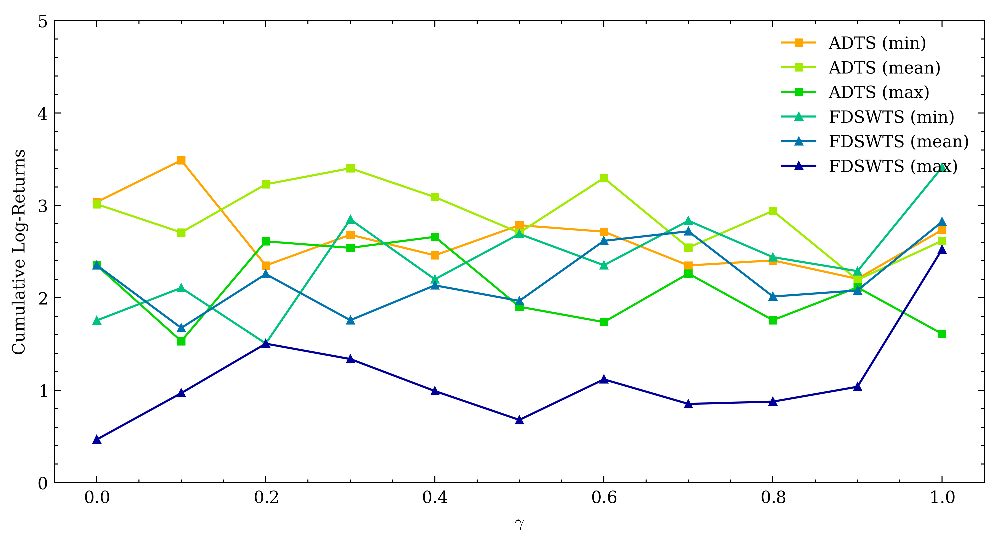

In [27]:
from colour import Color

blue = Color("orange")
colors = list(blue.range_to(Color("blue", luminance=0.3), len(results_dict)))

x_min = 0.79
x_max = 1.01
y_min = 0.
y_max = 1.5

with plt.style.context(['science', 'ieee', 'no-latex']):
    fig, ax = plt.subplots(figsize=(8, 4))
    legend = []
    i = 0
    for policy in results_dict.keys():
        if len(results_dict[policy]['reward']) > 0:
            plt.plot(results_dict[policy]["gamma_vec"], results_dict[policy]["reward"], markers[i], markersize=3, label=policy, color=colors[i].rgb, linestyle="-")
            i+=1    
    plt.xlabel(r'$\gamma$')
    plt.ylabel('Cumulative Log-Returns')
    plt.legend(loc='upper right')
    plt.ylim([0, 5.0])
    plt.savefig('04_effect_of_gamma_3.jpg', dpi=600)

## 2- Investigating the window size (w) on sw-d TS

In [28]:
w_vec = np.linspace(0, 300, 13)
w_vec[0]= 1

In [29]:
w_vec

array([  1.,  25.,  50.,  75., 100., 125., 150., 175., 200., 225., 250.,
       275., 300.])

In [30]:
gamma = 0.6

w_polices = {   
    f"ADTS (min) {i}": {
        "policy_name": "AdaptiveDiscountedThompsonSampling",
        "args": {"n_arms": portfolio.shape[1], "gamma": gamma, "f": "min", "w": int(w_vec[i])},
        "agents": [],
    }
    for i in range(len(w_vec))
}
w_polices.update(
    {   
        f"ADTS (mean) {i}": {
            "policy_name": "AdaptiveDiscountedThompsonSampling",
            "args": {"n_arms": portfolio.shape[1], "gamma": gamma, "f": "mean", "w": int(w_vec[i])},
            "agents": [],
        }
        for i in range(len(w_vec))
    }
)
w_polices.update(
    {   
        f"ADTS (max) {i}": {
            "policy_name": "AdaptiveDiscountedThompsonSampling",
            "args": {"n_arms": portfolio.shape[1], "gamma": gamma, "f": "max", "w": int(w_vec[i])},
            "agents": [],
        }
        for i in range(len(w_vec))
    }
)
w_polices.update(
    {   
        f"FDSWTS (min) {i}": {
            "policy_name": "CavenaghiFDSWTS",
            "args": {"n_arms": portfolio.shape[1], "gamma": gamma, "f": "min", "n": int(w_vec[i])},
            "agents": [],
        }
        for i in range(len(w_vec))
    }
)
w_polices.update(
    {   
        f"FDSWTS (mean) {i}": {
            "policy_name": "CavenaghiFDSWTS",
            "args": {"n_arms": portfolio.shape[1], "gamma": gamma, "f": "mean", "n": int(w_vec[i])},
            "agents": [],
        }
        for i in range(len(w_vec))
    }
)
w_polices.update(
    {   
        f"FDSWTS (max) {i}": {
            "policy_name": "CavenaghiFDSWTS",
            "args": {"n_arms": portfolio.shape[1], "gamma": gamma, "f": "max", "n": int(w_vec[i])},
            "agents": [],
        }
        for i in range(len(w_vec))
    }
)

In [31]:
from replay_engines.interface import BacktestInterface

w_bandit_backtester = BacktestInterface(
    bandit_policies=w_polices,
    n_simulations=10,
    reward_function="WindowedReturnArm",
    reward_function_args=dict(window=60),
    portfolio=portfolio,
)
w_bandit_backtester.run(n_threads=3)

 20%|███████████████████████████████████████▏                                                                                                                                                            | 2/10 [00:02<00:07,  1.07it/s]
%|███████████████████████████████████████▏                                                                                                                                                            | 2/10 [00:02<00:07,  1.10it/s]

 30%|██████████████████████████████████████████████████████████▊                                                                                                                                         | 3/10 [00:03<00:07,  1.03s/it]
%|██████████████████████████████████████████████████████████▊                                                                                                                                         | 3/10 [00:04<00:07,  1.02s/it]

 40%|███████████████████████████████████████████████████████████████████

In [32]:
groups = ["ADTS (min)", "ADTS (mean)", "ADTS (max)", "FDSWTS (min)", "FDSWTS (mean)", "FDSWTS (max)"]
markers = ["s", "s", "s", "^", "^", "^"]
line_styles = ["-", "-", "-", "--", "--", "--"]
results_dict = {}
for g in groups:
    results_dict[g] = {
        "w_vec": w_vec,
        "regret": [],
        "reward": [],
    }
    for k, v in w_bandit_backtester.bandit_policies.items():
        if g in k:
            results_dict[g]["regret"].append(v["mean_regret"].sum())
            results_dict[g]["reward"].append(v["mean_reward"].sum())

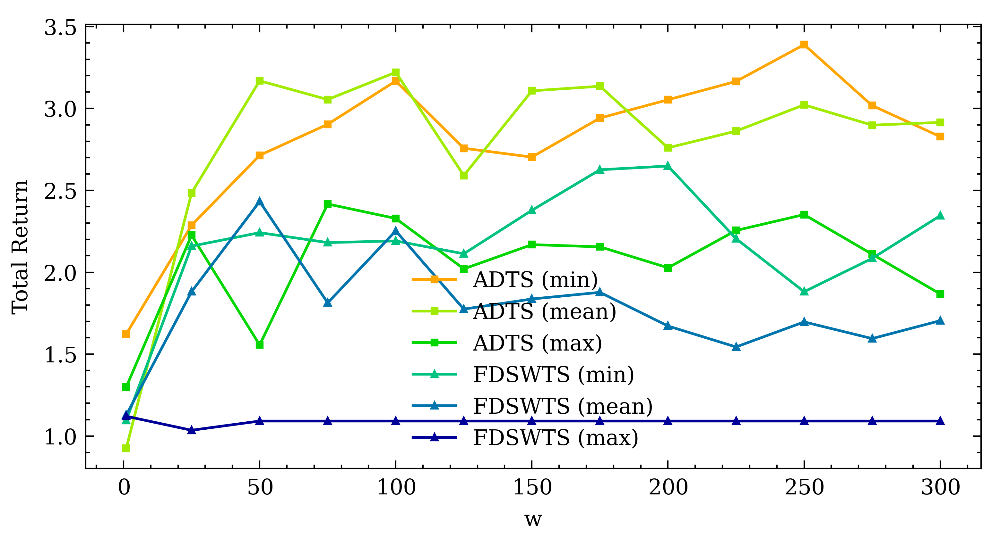

In [34]:
from colour import Color

blue = Color("orange")
colors = list(blue.range_to(Color("blue", luminance=0.3), len(results_dict)))

with plt.style.context(['science', 'ieee', 'no-latex']):
    fig, ax = plt.subplots(figsize=(6, 3))
    legend = []
    i = 0
    for policy in results_dict.keys():
        if len(results_dict[policy]['reward']) > 0:
            plt.plot(results_dict[policy]["w_vec"], results_dict[policy]["reward"], markers[i], markersize=2, label=policy, color=colors[i].rgb, linestyle="-")
            i+=1    
    plt.xlabel('w')
    plt.ylabel('Total Return')
    plt.legend()
    plt.savefig('04_effect_of_w_2.jpg', dpi=600)

## 3- Investigating the Rewards and Regrets

In [63]:
bandit_policies = {
    "ADTS (min)": {
        "policy_name": "AdaptiveDiscountedThompsonSampling",
        "args": {"n_arms": portfolio.shape[1], "gamma": 0.6, "f": "min", "w": 100},
    },
    # "ADTS (max)": {
    #     "policy_name": "AdaptiveDiscountedThompsonSampling",
    #     "args": {"n_arms": portfolio.shape[1], "gamma": 0.6, "f": "max", "w": 100},
    # },
    "ADTS (mean)": {
        "policy_name": "AdaptiveDiscountedThompsonSampling",
        "args": {"n_arms": portfolio.shape[1], "gamma": 0.6, "f": "mean", "w": 100},
    },
    "F-DSW TS (min)": {
        "policy_name": "CavenaghiFDSWTS",
        "args": {"n_arms": portfolio.shape[1], "gamma": 0.95, "f": "min", "n": 100},
    },
    # "F-DSW TS (max)": {
    #     "policy_name": "CavenaghiFDSWTS",
    #     "args": {"n_arms": portfolio.shape[1], "gamma": 0.6, "f": "max", "n": 100},
    # },
    "F-DSW TS (mean)": {
        "policy_name": "CavenaghiFDSWTS",
        "args": {"n_arms": portfolio.shape[1], "gamma": 0.95, "f": "mean", "n": 100},
    },
    "D TS": {
        "policy_name": "BetaDiscountedThompsonSampling",
        "args": {"n_arms": portfolio.shape[1], "gamma": 0.99},
    },
    "Classical TS": {
        "policy_name": "ThompsonSampling",
        "args": {"n_arms": portfolio.shape[1]},
    },
    "D UCB": {
        "policy_name": "DiscountedUCB1",
        "args": {"n_arms": portfolio.shape[1], "gamma": 0.1},
    },
    "SW UCB": {
        "policy_name": "SlidingWindowUCB1",
        "args": {"n_arms": portfolio.shape[1], "w": 100},
    },
    "UCB1": {
        "policy_name": "UCB1",
        "args": {"n_arms": portfolio.shape[1]},
    },
    # "$\epsilon$-Greedy": {
    #     "policy_name": "EpsilonGreedy",
    #     "args": {"n_arms": portfolio.shape[1], "epsilon": 0.02},
    # },
}

In [64]:
from replay_engines.interface import BacktestInterface

crypto_bandit_backtester = BacktestInterface(
    bandit_policies=bandit_policies,
    n_simulations=50,
    reward_function="WindowedReturnArm",
    reward_function_args=dict(window=60),
    portfolio=portfolio,
)
crypto_bandit_backtester.run(n_threads=3)


%|                                                                                                                                                                                                            | 0/50 [00:00<?, ?it/s]

  0%|                                                                                                                                                                                                            | 0/50 [00:00<?, ?it/s]
%|███▉                                                                                                                                                                                                | 1/50 [00:01<00:56,  1.14s/it]

  2%|███▉                                                                                                                                                                                                | 1/50 [00:01<00:29,  1.67it/s]
%|███████▊                                                             

In [65]:
from colour import Color
import numpy as np

blue = Color("orange", luminance=0.5)
colors = list(blue.range_to(Color("blue", luminance=0.3), len(crypto_bandit_backtester.bandit_policies)))

In [66]:
# crypto_bandit_backtester.plot_regrets(
#     save_fig=True,
#     figure_name="02_cumulative_regrets.jpg",
#     # plot_log=True,
#     personalized_colors=[c.rgb for c in colors]
# )

In [89]:
from replay_engines.interface import interpolate_colors

def plot_rewards(obj,                 
                 save_fig: bool = False,
                 figure_name: str = None,
                 oracle: np.ndarray = None,
                 oracle_name: str = "Oracle",
                 personalized_colors: list = None,
                 color_start: str = "#1f77b4",
                 color_end: str = "#ff7f0e"):

    if save_fig and figure_name is None:
        raise ValueError("Please provide a figure name to save the plot.")
    
    # Default Matplotlib blue and orange
    color_vector_size = len(obj.bandit_policies)
    colors = interpolate_colors(color_start, color_end, color_vector_size)
    if personalized_colors is not None:
        colors = personalized_colors
    
    with plt.style.context(['science', 'ieee', 'no-latex']):
        plt.subplots(figsize=(6, 3))
    
        if oracle is not None:
            plt.plot(obj.portfolio.index, np.exp(np.cumsum(oracle)), color='black', linestyle='-', label=oracle_name)
    
        i = 0
        for policy, output in obj.bandit_policies.items():
            plt.plot(obj.portfolio.index, np.exp(np.cumsum(output['mean_reward'])), color=colors[i], linestyle='-', label=policy)
            i += 1
        plt.legend(loc='upper left', fontsize=7)
        plt.xlabel('t', fontsize=10)
        plt.ylabel('Cumulative Returns', fontsize=10)
        if save_fig:
            plt.savefig(figure_name, dpi=600)

In [68]:
import numpy as np
import matplotlib.pyplot as plt

# Define the number of colors N
N = 2

# Default Matplotlib colors
matplotlib_orange = np.array(plt.cm.tab10.colors[1])  # index 1 corresponds to default orange
matplotlib_blue = np.array(plt.cm.tab10.colors[0])    # index 0 corresponds to default blue
matplotlib_green = np.array(plt.cm.tab10.colors[2])    # index 0 corresponds to default green
matplotlib_grey = np.array([0.5, 0.5, 0.5])    # index 0 corresponds to default green

# Define light versions by increasing the brightness (closer to white)
light_orange = matplotlib_orange + (1 - matplotlib_orange) * 0.4
light_blue = matplotlib_blue + (1 - matplotlib_blue) * 0.3
light_green = matplotlib_green + (1 - matplotlib_green) * 0.4
light_grey = matplotlib_grey + (1 - matplotlib_grey) * 0.4

# Interpolate between the colors
interpolated_orange_colors = [matplotlib_orange + (light_orange - matplotlib_orange) * i / (N - 1) for i in range(N)]
interpolated_blue_colors = [matplotlib_blue + (light_blue - matplotlib_blue) * i / (N - 1) for i in range(N)]
interpolated_green_colors = [matplotlib_green + (light_green - matplotlib_green) * i / (N - 1) for i in range(N)]

N=3
interpolated_grey_colors = [matplotlib_grey + (light_grey - matplotlib_grey) * i / (N - 1) for i in range(N)]


# interpolated_blue_colors.reverse()
interpolated_green_colors.reverse()

In [69]:
colors = interpolated_blue_colors + interpolated_orange_colors + interpolated_green_colors + interpolated_grey_colors

In [70]:
import yfinance as yf
import re


def retrieve_sp_returns():
    sp = ["^GSPC"]
    yf_obj = yf.Tickers(re.sub(r"'|,|\[|\]", "", str(sp)))
    today = datetime.date.today()

    df_sp = pd.DataFrame()
    for ticker in yf_obj.tickers.keys():
        df_ticker = yf_obj.tickers[ticker].history(start="2018-01-01", end="2025-01-11")
        df_ticker["ticker"] = ticker
        df_ticker["return"] = np.log(df_ticker["Close"] / df_ticker["Close"].shift(1))
        df_ticker["return"] = df_ticker["return"].fillna(0)
        df_ticker = df_ticker.reset_index()
        df_ticker = df_ticker[["Date", "ticker", "return"]]
        df_sp = pd.concat([df_sp, df_ticker])
    df_sp = df_sp.pivot_table(values="return", index="Date", columns="ticker")
    return df_sp

In [71]:
sp = retrieve_sp_returns()

In [77]:
for bandit_policy, output in crypto_bandit_backtester.bandit_policies.items():
    print(bandit_policy, output['mean_regret'].sum())

ADTS (min) 390.5478507309744
ADTS (mean) 388.55699322424334
F-DSW TS (min) 376.00340295954163
F-DSW TS (mean) 368.4687363982152
D TS 526.132829147386
Classical TS 441.9862613938932
D UCB 328.6962993631695
SW UCB 348.26616612358237
UCB1 340.5220597831209


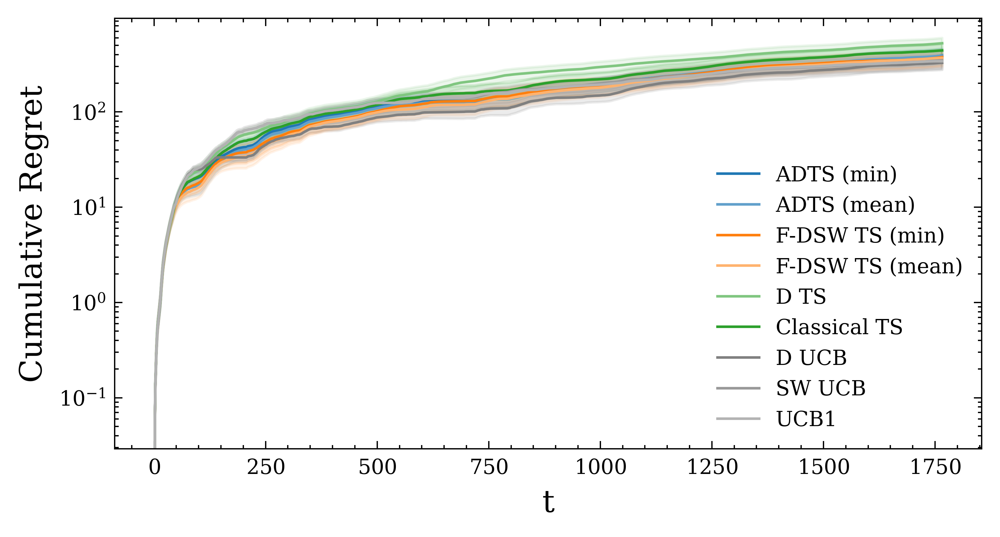

In [73]:
crypto_bandit_backtester.plot_regrets(
    personalized_colors=colors,
    plot_log=True,
)

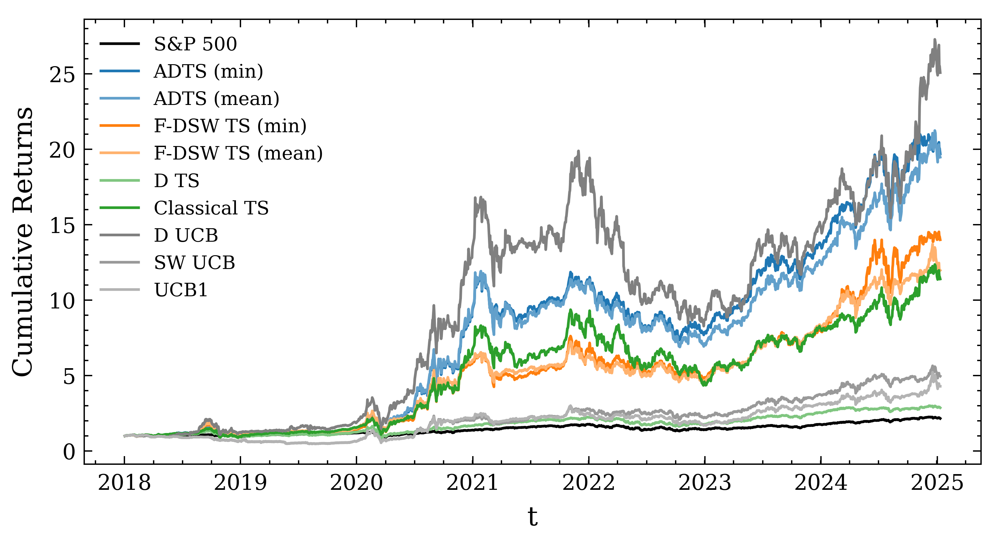

In [91]:
plot_rewards(
    crypto_bandit_backtester,
    save_fig=True,
    figure_name="03_rewards_versus_oracle.jpg",
    oracle_name="S&P 500",
    oracle=sp['^GSPC'].values,
    personalized_colors=colors
)
# plt.yscale('log')

In [19]:
def calculate_metrics(log_returns):
    returns = np.exp(log_returns) - 1
    cumulative_returns = np.cumprod(1 + returns) - 1
    daily_returns = np.mean(returns)
    volatility = np.std(returns)
    drawdown = np.min(cumulative_returns - np.maximum.accumulate(cumulative_returns))
    win_rate = np.sum(returns > 0) / len(returns)
    
    # Risk-adjusted ratios
    risk_free_rate = 0.0  # Assuming risk-free rate is zero
    excess_returns = returns - risk_free_rate
    sharpe_ratio = np.mean(excess_returns) / np.std(excess_returns) * np.sqrt(252)
    downside_deviation = np.std(excess_returns[excess_returns < 0])
    sortino_ratio = np.mean(excess_returns) / downside_deviation
    calmar_ratio = np.mean(excess_returns) / drawdown
    
    return {
        "Cumulative Returns": cumulative_returns[-1],
        "Sharpe Ratio": sharpe_ratio,
        "Maximum Drawdown": drawdown,
#         "Average Daily Returns": daily_returns,
        "Std. Deviation": volatility,
        # "Win Rate": win_rate,
        # "Sortino Ratio": sortino_ratio,
#         "Calmar Ratio": calmar_ratio
    }

In [20]:
def aggregate_metrics(policies: dict):
    portfolio_history = {}
    index = []
    for policy, output in policies.items():
        metrics_dict = calculate_metrics(output["mean_reward"])
        for k, v in metrics_dict.items():
            if k not in portfolio_history.keys():
                portfolio_history[k] = [v]
            else:
                portfolio_history[k].append(v)
        index.append(policy)
    df = pd.DataFrame(portfolio_history, index=index)
    df = df.sort_values("Cumulative Returns", ascending=False)
    return df

In [244]:
policies = crypto_bandit_backtester.bandit_policies.copy()
policies['S\&P'] = {
    "mean_reward": sp['^GSPC'].values
}

df_metrics = aggregate_metrics(policies)
df_metrics.to_csv('backtest_linear_bandits_crypto.csv')
df_metrics

,Cumulative Returns,Sharpe Ratio,Maximum Drawdown,Std. Deviation
D UCB,24.077788,1.159833,-11.611330,0.031960
ADTS (mean),19.411354,1.218960,-4.925687,0.026998
ADTS (min),18.693398,1.211174,-4.510034,0.026858
F-DSW TS (min),13.002349,1.111191,-3.500875,0.026326
F-DSW TS (mean),10.539285,1.061639,-2.719251,0.025672
Classical TS,10.170347,1.036495,-4.973216,0.026209
SW UCB,3.961063,0.772665,-0.844410,0.025190
UCB1,3.293683,0.712209,-1.312358,0.025915
D TS,1.971248,0.757471,-0.844803,0.015462
S\&P,1.161517,0.657174,-0.452380,0.012409


In [78]:
df_metrics = pd.read_csv("backtest_linear_bandits_crypto.csv")

In [79]:
df_metrics

,Unnamed: 0,Cumulative Returns,Sharpe Ratio,Maximum Drawdown,Std. Deviation
0,D UCB,24.077788,1.159833,-11.611330,0.031960
1,ADTS (mean),19.411354,1.218960,-4.925687,0.026998
2,ADTS (min),18.693398,1.211174,-4.510034,0.026858
3,F-DSW TS (min),13.002349,1.111191,-3.500875,0.026326
4,F-DSW TS (mean),10.539285,1.061639,-2.719251,0.025672
5,Classical TS,10.170347,1.036495,-4.973216,0.026209
6,SW UCB,3.961063,0.772665,-0.844410,0.025190
7,UCB1,3.293683,0.712209,-1.312358,0.025915
8,D TS,1.971248,0.757471,-0.844803,0.015462
9,S\&P,1.161517,0.657174,-0.452380,0.012409


In [82]:
df_metrics = df_metrics.set_index("Unnamed: 0")

In [85]:
import numpy as np

# Generate LaTeX table
table = "\\begin{table}[h]\n"
table += "\\centering\n"
table += "\\begin{tabular}{lcccccc}\n"
table += "\\hline\n"
table += "Policy & Cumulative Returns & SR & MDD & $\sigma$ \\\n"
table += "\\hline\n"
for i in range(len(df_metrics.index)):
    ticker=df_metrics.index[i]
    results_list = list(df_metrics.loc[ticker, :])
    results_list = [f"${abs(float(r)):.2f}$" if r > 1.0 else f"${abs(float(r)):.3f}$" for r in results_list]
    start_line = f"{ticker} & "
    end_line = "\\\\\n"
    table +=  start_line + " & ".join(results_list) + end_line
table += "\\hline\n"
table += "\\end{tabular}\n"
table += "\\caption{Stocks Daily Risks and Returns}\n"
table += "\\end{table}\n"

print(table)

\begin{table}[h]
\centering
\begin{tabular}{lcccccc}
\hline
Policy & Cumulative Returns & SR & MDD & $\sigma$ \
\hline
D UCB & $24.08$ & $1.16$ & $11.611$ & $0.032$\\
ADTS (mean) & $19.41$ & $1.22$ & $4.926$ & $0.027$\\
ADTS (min) & $18.69$ & $1.21$ & $4.510$ & $0.027$\\
F-DSW TS (min) & $13.00$ & $1.11$ & $3.501$ & $0.026$\\
F-DSW TS (mean) & $10.54$ & $1.06$ & $2.719$ & $0.026$\\
Classical TS & $10.17$ & $1.04$ & $4.973$ & $0.026$\\
SW UCB & $3.96$ & $0.773$ & $0.844$ & $0.025$\\
UCB1 & $3.29$ & $0.712$ & $1.312$ & $0.026$\\
D TS & $1.97$ & $0.757$ & $0.845$ & $0.015$\\
S\&P & $1.16$ & $0.657$ & $0.452$ & $0.012$\\
\hline
\end{tabular}
\caption{Stocks Daily Risks and Returns}
\end{table}



## 4- Drift Analysis

In [98]:
portfolio_drifted = portfolio.copy()
portfolio_drifted = portfolio_drifted.reset_index()
portfolio_drifted['Date'] = pd.to_datetime(portfolio_drifted['Date']).dt.date
portfolio_drifted = portfolio_drifted.set_index('Date')
portfolio_drifted.head()
portfolio_drifted["NVDA"].loc[datetime.date(2024, 1, 3)] = -1.5

/var/folders/pr/c2dbtqtn2td9ylt9lvrqnrxc0000gn/T/ipykernel_11355/3354488638.py:6: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  portfolio_drifted["NVDA"].loc[datetime.date(2024, 1, 3)] = -1.5


In [141]:
np.exp(3)*100

np.float64(2008.5536923187667)

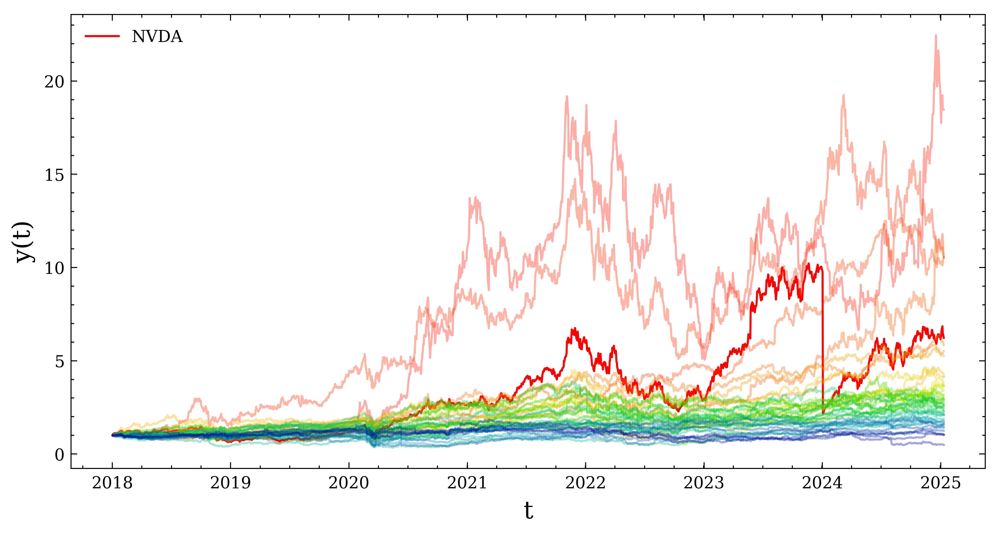

In [144]:
from colour import Color

blue = Color("red", luminance=0.5)
colors = list(blue.range_to(Color("blue", luminance=0.3), len(portfolio.columns)))

with plt.style.context(['science', 'ieee', 'no-latex']):
    fig, ax = plt.subplots(figsize=(8, 4))
    i = 0
    for col in portfolio_drifted.columns:
        if col == "NVDA":
            plt.plot(np.exp(portfolio_drifted[col].cumsum()), color="r", linestyle="-", label=col)
        else:
            plt.plot(np.exp(portfolio_drifted[col].cumsum()), alpha=0.35, color=colors[i].rgb, linestyle="-")
        i += 1
    #     plt.legend(portfolio.columns, fontsize=4)
    plt.legend()
    plt.xlabel('t', fontsize=12)
    plt.ylabel('y(t)', fontsize=12)
    plt.savefig('drifted_nvda.jpg', dpi=600)

In [101]:
from replay_engines.interface import BacktestInterface

drift_bandit_backtester = BacktestInterface(
    bandit_policies=bandit_policies,
    n_simulations=50,
    reward_function="WindowedReturnArm",
    reward_function_args=dict(window=60),
    portfolio=portfolio_drifted,
)
drift_bandit_backtester.run(n_threads=3)

  0%|                                                                                                                                                                                                            | 0/50 [00:00<?, ?it/s]
%|                                                                                                                                                                                                            | 0/50 [00:00<?, ?it/s]

  2%|███▉                                                                                                                                                                                                | 1/50 [00:01<00:33,  1.48it/s]
%|███▉                                                                                                                                                                                                | 1/50 [00:01<00:30,  1.58it/s]

  4%|███████▊                                                           

In [248]:
portfolio_history = {}
for policy, output in drift_bandit_backtester.bandit_policies.items():
    rewards_mtx = output["rewards_matrix"]
    for j in range(rewards_mtx.shape[1]):
        metrics_dict = calculate_metrics(rewards_mtx[:, j])
        for k, v in metrics_dict.items():
            if k not in portfolio_history.keys():
                portfolio_history[k] = {}
            if policy not in portfolio_history[k].keys():
                portfolio_history[k][policy] = [v]
                continue
            portfolio_history[k][policy].append(v)


In [249]:
red = Color("red", luminance=0.5)
policies = list(portfolio_history['Cumulative Returns'].keys())
colors = list(red.range_to(Color("blue", luminance=0.3), len(bandit_policies)))
policies_colors_dict = dict(zip(policies, colors))

Cumulative Returns
D UCB              19.109660
ADTS (min)         15.628229
ADTS (mean)        14.902901
Classical TS       10.940291
F-DSW TS (mean)     8.594848
F-DSW TS (min)      8.259326
SW UCB              3.127622
UCB1                2.805286
D TS                1.529006
dtype: float64


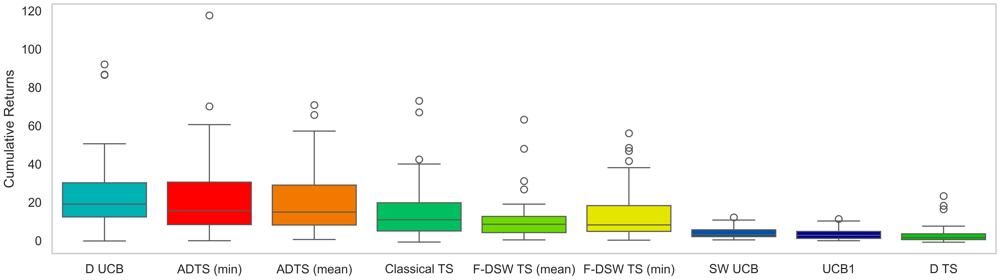

Sharpe Ratio
ADTS (min)         1.030134
D UCB              1.028460
ADTS (mean)        1.002397
Classical TS       0.926764
F-DSW TS (mean)    0.892067
F-DSW TS (min)     0.888184
SW UCB             0.669595
UCB1               0.638527
D TS               0.534969
dtype: float64


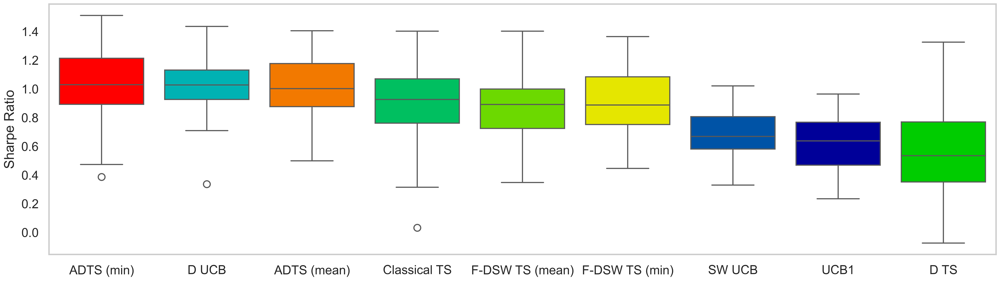

Maximum Drawdown
D TS               -1.403441
SW UCB             -1.690514
UCB1               -1.792795
F-DSW TS (min)     -4.722178
F-DSW TS (mean)    -5.296849
Classical TS       -7.129632
ADTS (min)         -7.962730
ADTS (mean)        -9.858726
D UCB             -16.689958
dtype: float64


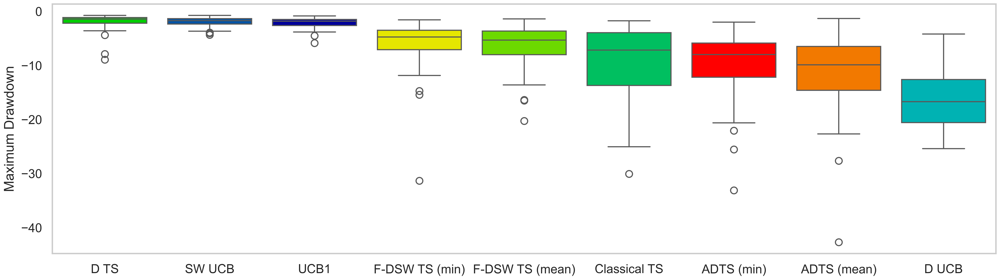

Std. Deviation
D UCB              0.036388
Classical TS       0.034312
ADTS (mean)        0.033077
ADTS (min)         0.032535
F-DSW TS (min)     0.032346
F-DSW TS (mean)    0.031597
UCB1               0.030475
SW UCB             0.029591
D TS               0.023874
dtype: float64


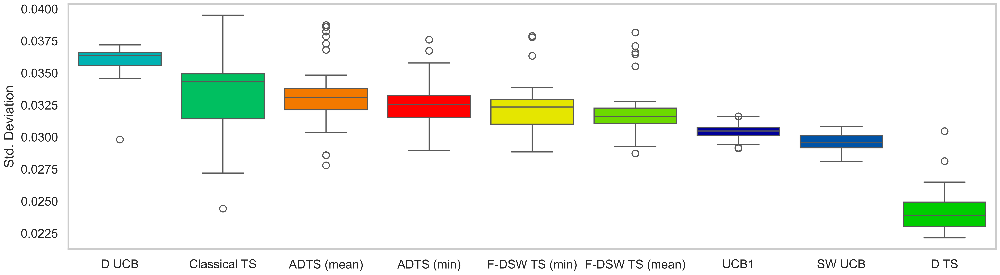

In [250]:
import matplotlib.pyplot as plt
import seaborn as sns



with plt.style.context(['science', 'ieee', 'no-latex']):
    for kpi in portfolio_history.keys():
        df = pd.DataFrame(portfolio_history[kpi])
        # Set plot style
        sns.set(style="whitegrid")

        # Create the boxplot
        fig, ax = plt.subplots(figsize=(15, 4))
        print(kpi)
        print(df.median(axis=0).sort_values(ascending=False))
        ordered_policies = list(df.median(axis=0).sort_values(ascending=False).index)
        boxplot = sns.boxplot(
            data=df[ordered_policies], 
            palette="Set2", 
            ax=ax
        )
        for patch, policy in zip(ax.patches, ordered_policies):
            patch.set_facecolor(policies_colors_dict[policy].rgb)
        plt.ylabel(kpi, fontsize=12)
#         plt.yscale('log')
        plt.grid(visible=False)

        plt.savefig(f'drift_analysis_{kpi}.jpg', dpi=600)
        plt.show()

## 4- Investigating Bandit Networks

In [143]:
np.exp(8)*100

np.float64(298095.79870417283)

In [103]:
bandit_portfolio_size = 15

bandit_net_policies = {
    f"ADTS (mean) + SW UCB | (n={bandit_portfolio_size})": {
        "network_name": "BanditNetwork",
        "final_layer_policy_name": "AdaptiveDiscountedThompsonSampling",
        "final_layer_policy_args": {"n_arms": portfolio.shape[1], "gamma": 0.6, "f": "mean", "w": 100},
        "policy_name": "SlidingWindowUCB1",
        "args": {"n_arms": portfolio.shape[1], "w": 30},
        "combinatorial_agents": [],
        "agents": [],
        "chosen_superarms": []
    },
    f"ADTS (mean) + f-DSW TS | (n={bandit_portfolio_size})": {
        "network_name": "BanditNetwork",
        "final_layer_policy_name": "AdaptiveDiscountedThompsonSampling",
        "final_layer_policy_args": {"n_arms": portfolio.shape[1], "gamma": 0.6, "f": "mean", "w": 100},
        "policy_name": "CavenaghiFDSWTS",
        "args": {"n_arms": portfolio.shape[1], "gamma": 0.95, "f": "min", "n": 100},
        "combinatorial_agents": [],
        "agents": [],
        "chosen_superarms": []
    },
    f"Two Stage ADTS (mean) | (n={bandit_portfolio_size})": {
        "network_name": "BanditNetwork",
        "final_layer_policy_name": "AdaptiveDiscountedThompsonSampling",
        "final_layer_policy_args": {"n_arms": portfolio.shape[1], "gamma": 0.6, "f": "mean", "w": 100},
        "policy_name": "AdaptiveDiscountedThompsonSampling",
        "args": {"n_arms": portfolio.shape[1], "gamma": 0.6, "f": "mean", "w": 100},
        "combinatorial_agents": [],
        "agents": [],
        "chosen_superarms": []
    },
    f"ADTS (mean) + Classical TS | (n={bandit_portfolio_size})": {
        "network_name": "BanditNetwork",
        "final_layer_policy_name": "AdaptiveDiscountedThompsonSampling",
        "final_layer_policy_args": {"n_arms": portfolio.shape[1], "gamma": 0.6, "f": "mean", "w": 100},
        "policy_name": "ThompsonSampling",
        "args": {"n_arms": portfolio.shape[1]},
        "combinatorial_agents": [],
        "agents": [],
        "chosen_superarms": []
    },
    f"ADTS (mean) + D UCB | (n={bandit_portfolio_size})": {
        "network_name": "BanditNetwork",
        "final_layer_policy_name": "AdaptiveDiscountedThompsonSampling",
        "final_layer_policy_args": {"n_arms": portfolio.shape[1], "gamma": 0.6, "f": "mean", "w": 100},
        "policy_name": "DiscountedUCB1",
        "args": {"n_arms": portfolio.shape[1], "gamma": 0.1},
        "combinatorial_agents": [],
        "agents": [],
        "chosen_superarms": []
    },
}

comb_portfolio_size = 4
comb_bandit_net_policies = {
    f"SW UCB + CADTS| (n={comb_portfolio_size})": {
        "network_name": "CombinatorialBanditNetwork",
        "final_layer_policy_name": "CombinatorialAdaptiveDiscountedThompsonSampling",
        "final_layer_policy_args": {"n_arms": portfolio.shape[1], "gamma": 0.6, "f": "mean", "w": 100},
        "policy_name": "SlidingWindowUCB1",
        "args": {"n_arms": portfolio.shape[1], "w": 30},
        "combinatorial_agents": [],
        "agents": [],
        "chosen_superarms": []
    },    
    f"ADTS + CADTS| (n={comb_portfolio_size})": {
        "network_name": "CombinatorialBanditNetwork",
        "final_layer_policy_name": "CombinatorialAdaptiveDiscountedThompsonSampling",
        "final_layer_policy_args": {"n_arms": portfolio.shape[1], "gamma": 0.6, "f": "mean", "w": 100},
        "policy_name": "AdaptiveDiscountedThompsonSampling",
        "args": {"n_arms": portfolio.shape[1], "gamma": 0.6, "f": "mean", "w": 100},
        "combinatorial_agents": [],
        "agents": [],
        "chosen_superarms": []
    },  
}

In [126]:
from replay_engines.interface import BanditNetworkBacktestInterface

bandit_backtester = BanditNetworkBacktestInterface(
    bandit_policies=bandit_net_policies,
    portfolio_size=bandit_portfolio_size,
    n_simulations=50,
    reward_function="WindowedReturnArm",
    reward_function_args=dict(window=60),
    portfolio=portfolio,
)
bandit_backtester.run()

comb_bandit_backtester = BanditNetworkBacktestInterface(
    bandit_policies=comb_bandit_net_policies,
    portfolio_size=comb_portfolio_size,
    n_simulations=50,
    reward_function="WindowedReturnArm",
    reward_function_args=dict(window=60),
    portfolio=portfolio,
)
comb_bandit_backtester.run()


  0%|                                                                                                                                                                                                            | 0/50 [00:00<?, ?it/s]

                                                                                                                                                                                                           | 0/50 [00:00<?, ?it/s]


                                                                                                                                                                                                        | 0/50 [00:00<?, ?it/s]



  2%|███▉                                                                                                                                                                                                | 1/50 [00:03<03:07,  3.83s/it]

██▉                                                                        

In [127]:
bandit_backtester.bandit_policies.update(comb_bandit_backtester.bandit_policies)

In [128]:
from colour import Color

blue = Color("orange", luminance=0.5)
colors = list(blue.range_to(Color("blue", luminance=0.3), len(bandit_backtester.bandit_policies)))

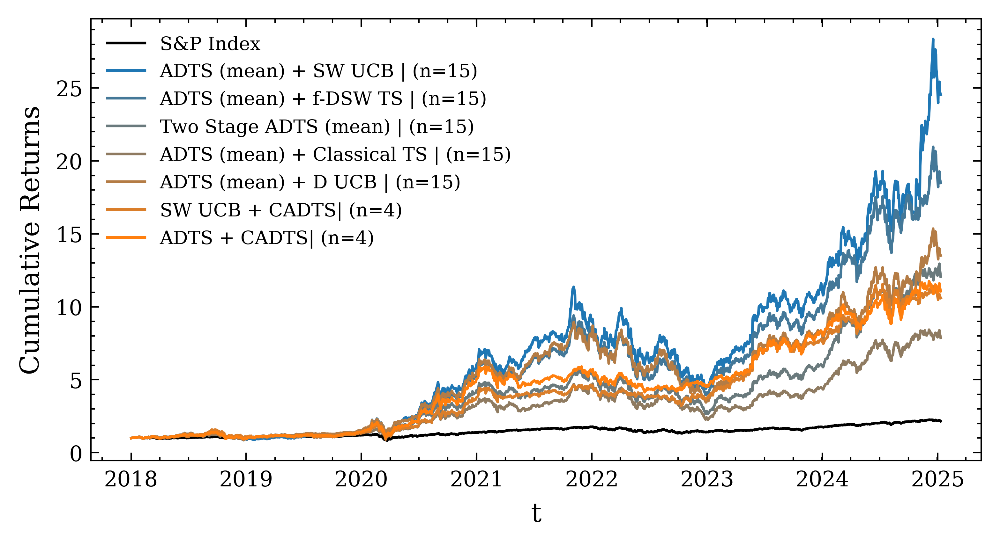

In [129]:
plot_rewards(
    bandit_backtester,
    # save_fig=True,
    # figure_name="03_rewards_versus_oracle_portfolio_exp.jpg",
    oracle=sp['^GSPC'].values,
    oracle_name='S&P Index',
    # personalized_colors=[c.rgb for c in colors]
)
# ax = plt.gca()
# ax.legend(['a'])
# plt.plot(data[['^CMC200']].cumsum())
# plt.show()

In [130]:
from portfolio.classical import MarkovitzPortfolio, EqualWeightsPortfolio, RiskParityPortfolio, CAPMPortfolio
from pandas import DataFrame


def calculate_classical_portfolios(portfolio: DataFrame, adjust_frequency: int = 30) -> DataFrame:
    """
    This function calculates the equal weights, risk parity, Markowitz, and Black-Litterman portfolios.
    """
    equal_weights = EqualWeightsPortfolio(portfolio_log_returns=portfolio, adjust_frequency=adjust_frequency).run_backtest()
    risk_parity = RiskParityPortfolio(portfolio_log_returns=portfolio, adjust_frequency=adjust_frequency).run_backtest()
    markowitz = MarkovitzPortfolio(portfolio_log_returns=portfolio, adjust_frequency=adjust_frequency).run_backtest()
    capm = CAPMPortfolio(portfolio_log_returns=portfolio, adjust_frequency=adjust_frequency).run_backtest()
    return pd.DataFrame({
        "Equal Weights": equal_weights,
        "Risk Parity": risk_parity,
        "Markowitz": markowitz,
        "CAPM": capm,
    })

In [134]:
classical_policies = {}

df_classical = calculate_classical_portfolios(portfolio=portfolio)
for col in df_classical.columns:
    classical_policies[col] = {
        "mean_reward": df_classical[col].fillna(0.).values
    }
classical_policies['S\&P Index'] = {'mean_reward': sp['^GSPC'].values}

In [135]:
unified_policies = bandit_backtester.bandit_policies.copy()
unified_policies.update(classical_policies)

In [136]:
df_metrics = aggregate_metrics(unified_policies)
# df_metrics.to_csv('backtest_bandit_networks_sp.csv')
df_metrics

,Cumulative Returns,Sharpe Ratio,Maximum Drawdown,Std. Deviation
ADTS (mean) + SW UCB | (n=15),23.544250,1.259678,-6.971853,0.027663
ADTS (mean) + f-DSW TS | (n=15),17.492740,1.232679,-5.451106,0.025462
ADTS (mean) + D UCB | (n=15),12.512296,1.116192,-5.497980,0.025652
Two Stage ADTS (mean) | (n=15),11.070820,1.169715,-2.987089,0.022629
ADTS + CADTS| (n=4),10.068795,1.148785,-1.960154,0.022245
SW UCB + CADTS| (n=4),9.608093,1.146691,-2.307202,0.021816
ADTS (mean) + Classical TS | (n=15),6.876640,1.026689,-2.464292,0.021737
CAPM,2.150238,0.865281,-0.752954,0.013629
Equal Weights,1.852417,0.843176,-0.636623,0.012695
Risk Parity,1.319012,0.735714,-0.479382,0.011778


In [137]:
import numpy as np

# Generate LaTeX table
table = "\\begin{table}[h]\n"
table += "\\centering\n"
table += "\\begin{tabular}{lcccccc}\n"
table += "\\hline\n"
table += "Network Instance & Cumulative Returns & SR & MDD & $\sigma$ \\\n"
table += "\\hline\n"
for i in range(len(df_metrics.index)):
    ticker=df_metrics.index[i]
    results_list = list(df_metrics.loc[ticker, :])
    results_list = [f"${abs(float(r)):.2f}$" if abs(r) > 1.0 else f"${abs(float(r)):.3f}$" for r in results_list]
    start_line = f"{ticker} & "
    end_line = "\\\\\n"
    table +=  start_line + " & ".join(results_list) + end_line
table += "\\hline\n"
table += "\\end{tabular}\n"
table += "\\caption{Stocks Daily Risks and Returns}\n"
table += "\\end{table}\n"

print(table)

\begin{table}[h]
\centering
\begin{tabular}{lcccccc}
\hline
Network Instance & Cumulative Returns & SR & MDD & $\sigma$ \
\hline
ADTS (mean) + SW UCB | (n=15) & $23.54$ & $1.26$ & $6.97$ & $0.028$\\
ADTS (mean) + f-DSW TS | (n=15) & $17.49$ & $1.23$ & $5.45$ & $0.025$\\
ADTS (mean) + D UCB | (n=15) & $12.51$ & $1.12$ & $5.50$ & $0.026$\\
Two Stage ADTS (mean) | (n=15) & $11.07$ & $1.17$ & $2.99$ & $0.023$\\
ADTS + CADTS| (n=4) & $10.07$ & $1.15$ & $1.96$ & $0.022$\\
SW UCB + CADTS| (n=4) & $9.61$ & $1.15$ & $2.31$ & $0.022$\\
ADTS (mean) + Classical TS | (n=15) & $6.88$ & $1.03$ & $2.46$ & $0.022$\\
CAPM & $2.15$ & $0.865$ & $0.753$ & $0.014$\\
Equal Weights & $1.85$ & $0.843$ & $0.637$ & $0.013$\\
Risk Parity & $1.32$ & $0.736$ & $0.479$ & $0.012$\\
S\&P Index & $1.16$ & $0.657$ & $0.452$ & $0.012$\\
Markowitz & $0.212$ & $0.326$ & $0.280$ & $0.006$\\
\hline
\end{tabular}
\caption{Stocks Daily Risks and Returns}
\end{table}



# Portfolio robustne

In [14]:
from replay_engines.interface import BanditNetworkBacktestInterface

def run_two_layer_portfolio(bandit_portfolio_size: int, portfolio: pd.DataFrame) -> dict:
    bandit_net_policies = {
        f"ADTS (mean) + SW UCB | (n={bandit_portfolio_size})": {
            "network_name": "BanditNetwork",
            "final_layer_policy_name": "AdaptiveDiscountedThompsonSampling",
            "final_layer_policy_args": {"n_arms": portfolio.shape[1], "gamma": 0.6, "f": "mean", "w": 100},
            "policy_name": "SlidingWindowUCB1",
            "args": {"n_arms": portfolio.shape[1], "w": 30},
            "combinatorial_agents": [],
            "agents": [],
            "chosen_superarms": []
        },
        f"ADTS (mean) + f-DSW TS | (n={bandit_portfolio_size})": {
            "network_name": "BanditNetwork",
            "final_layer_policy_name": "AdaptiveDiscountedThompsonSampling",
            "final_layer_policy_args": {"n_arms": portfolio.shape[1], "gamma": 0.6, "f": "mean", "w": 100},
            "policy_name": "CavenaghiFDSWTS",
            "args": {"n_arms": portfolio.shape[1], "gamma": 0.95, "f": "min", "n": 100},
            "combinatorial_agents": [],
            "agents": [],
            "chosen_superarms": []
        },
        f"Two Stage ADTS (mean) | (n={bandit_portfolio_size})": {
            "network_name": "BanditNetwork",
            "final_layer_policy_name": "AdaptiveDiscountedThompsonSampling",
            "final_layer_policy_args": {"n_arms": portfolio.shape[1], "gamma": 0.6, "f": "mean", "w": 100},
            "policy_name": "AdaptiveDiscountedThompsonSampling",
            "args": {"n_arms": portfolio.shape[1], "gamma": 0.6, "f": "mean", "w": 100},
            "combinatorial_agents": [],
            "agents": [],
            "chosen_superarms": []
        },
    }

    bandit_backtester = BanditNetworkBacktestInterface(
        bandit_policies=bandit_net_policies,
        portfolio_size=bandit_portfolio_size,
        n_simulations=30,
        reward_function="WindowedReturnArm",
        reward_function_args=dict(window=60),
        portfolio=portfolio,
    )
    bandit_backtester.run()
    return bandit_backtester.bandit_policies


def run_comb_portfolio(comb_portfolio_size: int, portfolio: pd.DataFrame) -> dict:
    comb_bandit_net_policies = {
        f"SW UCB + CADTS| (n={comb_portfolio_size})": {
            "network_name": "CombinatorialBanditNetwork",
            "final_layer_policy_name": "CombinatorialAdaptiveDiscountedThompsonSampling",
            "final_layer_policy_args": {"n_arms": portfolio.shape[1], "gamma": 0.6, "f": "mean", "w": 100},
            "policy_name": "SlidingWindowUCB1",
            "args": {"n_arms": portfolio.shape[1], "w": 30},
            "combinatorial_agents": [],
            "agents": [],
            "chosen_superarms": []
        },    
        f"ADTS + CADTS| (n={comb_portfolio_size})": {
            "network_name": "CombinatorialBanditNetwork",
            "final_layer_policy_name": "CombinatorialAdaptiveDiscountedThompsonSampling",
            "final_layer_policy_args": {"n_arms": portfolio.shape[1], "gamma": 0.6, "f": "mean", "w": 100},
            "policy_name": "AdaptiveDiscountedThompsonSampling",
            "args": {"n_arms": portfolio.shape[1], "gamma": 0.6, "f": "mean", "w": 100},
            "combinatorial_agents": [],
            "agents": [],
            "chosen_superarms": []
        },  
    }
    comb_bandit_backtester = BanditNetworkBacktestInterface(
        bandit_policies=comb_bandit_net_policies,
        portfolio_size=comb_portfolio_size,
        n_simulations=30,
        reward_function="WindowedReturnArm",
        reward_function_args=dict(window=60),
        portfolio=portfolio,
    )
    comb_bandit_backtester.run()
    return comb_bandit_backtester.bandit_policies

In [23]:
def collect_box_plot_values(bandit_policies: dict):
    boxplot_dict = {}
    for key in bandit_policies.keys():
        boxplot_dict[key] = {}
        matrix = bandit_policies[key]["rewards_matrix"]

        for j in range(matrix.shape[1]):
            reward_array = matrix[:, j]
            dict_metric = calculate_metrics(reward_array)
            for k, v in dict_metric.items():
                if k not in boxplot_dict[key].keys():
                    boxplot_dict[key][k] = [v]
                else:
                    boxplot_dict[key][k].append(v)
    return boxplot_dict

In [24]:
robustness_dict = {}
dropped_stocks = []

df_sp = retrieve_sp_returns()

portfolio_copy = portfolio.copy()

for i in range(10):
    total_returns = portfolio_copy.sum(axis=0).sort_values(ascending=False)
    df_classical = calculate_classical_portfolios(portfolio=portfolio_copy)
    
    bandit_policies = run_two_layer_portfolio(bandit_portfolio_size=4, portfolio=portfolio_copy)
    bandit_policies.update(run_two_layer_portfolio(bandit_portfolio_size=10, portfolio=portfolio_copy))
    bandit_policies.update(run_two_layer_portfolio(bandit_portfolio_size=15, portfolio=portfolio_copy))
    bandit_policies.update(run_comb_portfolio(comb_portfolio_size=4, portfolio=portfolio_copy))
    bandits_boxplot_dict = collect_box_plot_values(bandit_policies=bandit_policies)
    policies = bandit_policies.copy()
    df_classical = calculate_classical_portfolios(portfolio=portfolio_copy)
    for col in df_classical.columns:
        policies[col] = {
            "mean_reward": df_classical[col].values
        }
    policies["S&P 500"] = {
        "mean_reward": df_sp["^GSPC"].values
    }
    df_results = aggregate_metrics(policies=policies)
    
    
    robustness_dict[i] = {
        "df_results": df_results,
        "dropped_stocks": dropped_stocks,
        "bandits_boxplot_dict": bandits_boxplot_dict
    }
    prev_total_stocks = len(portfolio.columns)
    pop_best = total_returns.index[0]
    portfolio_copy = portfolio_copy.drop(columns=[pop_best])
    dropped_stocks.append(pop_best)
    print(f"Removing stock {pop_best} from search space")

  0%|                                                                                                                                                                                                            | 0/30 [00:00<?, ?it/s]

                                                                                                                                                                                                           | 0/30 [00:00<?, ?it/s]
  3%|██████▌                                                                                                                                                                                             | 1/30 [00:01<00:09,  3.02it/s]

█████▌                                                                                                                                                                                             | 1/30 [00:01<00:23,  1.25it/s]
  7%|█████████████                                                            

Removing stock NVDA from search space


  0%|                                                                                                                                                                                                            | 0/30 [00:00<?, ?it/s]
%|                                                                                                                                                                                                            | 0/30 [00:00<?, ?it/s]

  3%|██████▌                                                                                                                                                                                             | 1/30 [00:01<00:13,  2.22it/s]
%|██████▌                                                                                                                                                                                             | 1/30 [00:01<00:09,  3.09it/s]

  7%|█████████████                                                      

Removing stock TSLA from search space


  3%|██████▌                                                                                                                                                                                             | 1/30 [00:00<00:09,  3.08it/s]
%|                                                                                                                                                                                                            | 0/30 [00:00<?, ?it/s]

  7%|█████████████                                                                                                                                                                                       | 2/30 [00:01<00:09,  3.11it/s]
%|██████▌                                                                                                                                                                                             | 1/30 [00:01<00:12,  2.24it/s]

 10%|███████████████████▌                                               

Removing stock AMD from search space


  0%|                                                                                                                                                                                                            | 0/30 [00:00<?, ?it/s]
%|                                                                                                                                                                                                            | 0/30 [00:00<?, ?it/s]

  3%|██████▌                                                                                                                                                                                             | 1/30 [00:00<00:09,  3.10it/s]
%|██████▌                                                                                                                                                                                             | 1/30 [00:01<00:12,  2.26it/s]

  7%|█████████████                                                      

Removing stock LLY from search space


  3%|██████▌                                                                                                                                                                                             | 1/30 [00:00<00:09,  3.20it/s]

                                                                                                                                                                                                           | 0/30 [00:00<?, ?it/s]
  7%|█████████████                                                                                                                                                                                       | 2/30 [00:01<00:16,  1.73it/s]

█████▌                                                                                                                                                                                             | 1/30 [00:01<00:20,  1.38it/s]
 10%|███████████████████▌                                                     

Removing stock AVGO from search space


  3%|██████▌                                                                                                                                                                                             | 1/30 [00:00<00:09,  3.15it/s]
%|██████▌                                                                                                                                                                                             | 1/30 [00:00<00:12,  2.32it/s]

  7%|█████████████                                                                                                                                                                                       | 2/30 [00:01<00:16,  1.74it/s]
%|█████████████                                                                                                                                                                                       | 2/30 [00:02<00:17,  1.61it/s]

 10%|███████████████████▌                                               

Removing stock AAPL from search space



  0%|                                                                                                                                                                                                            | 0/30 [00:00<?, ?it/s]

                                                                                                                                                                                                           | 0/30 [00:00<?, ?it/s]
  3%|██████▌                                                                                                                                                                                             | 1/30 [00:01<00:09,  3.18it/s]

█████▌                                                                                                                                                                                             | 1/30 [00:01<00:20,  1.43it/s]
  7%|█████████████                                                           

Removing stock COST from search space


  3%|██████▌                                                                                                                                                                                             | 1/30 [00:00<00:09,  3.21it/s]
%|                                                                                                                                                                                                            | 0/30 [00:00<?, ?it/s]

  7%|█████████████                                                                                                                                                                                       | 2/30 [00:01<00:08,  3.21it/s]
%|██████▌                                                                                                                                                                                             | 1/30 [00:01<00:12,  2.37it/s]

 10%|███████████████████▌                                               

Removing stock MSFT from search space



  0%|                                                                                                                                                                                                            | 0/30 [00:00<?, ?it/s]

                                                                                                                                                                                                           | 0/30 [00:00<?, ?it/s]
  3%|██████▌                                                                                                                                                                                             | 1/30 [00:01<00:09,  3.20it/s]

█████▌                                                                                                                                                                                             | 1/30 [00:01<00:20,  1.45it/s]
  7%|█████████████                                                           

Removing stock NFLX from search space


  0%|                                                                                                                                                                                                            | 0/30 [00:00<?, ?it/s]
%|                                                                                                                                                                                                            | 0/30 [00:00<?, ?it/s]

  3%|██████▌                                                                                                                                                                                             | 1/30 [00:00<00:09,  3.20it/s]
%|██████▌                                                                                                                                                                                             | 1/30 [00:01<00:12,  2.39it/s]

  7%|█████████████                                                      

Removing stock INTU from search space


In [25]:
import pickle

with open('robustness_dict.pkl', 'wb') as f:
    pickle.dump(robustness_dict, f)

In [28]:
# robustness_dict

In [29]:
import pickle
with open('robustness_dict.pkl', 'rb') as f:
    robustness_dict = pickle.load(f)

In [30]:
inverted_dict = {}

for key in robustness_dict.keys():
    bp_dict = robustness_dict[key]['bandits_boxplot_dict']
    for policy, results_dict in bp_dict.items():
        for metric_name, metric_list in results_dict.items():
            if metric_name not in inverted_dict.keys():
                inverted_dict[metric_name] = {}
            if policy not in inverted_dict[metric_name].keys():
                inverted_dict[metric_name][policy] = {}
            if key not in inverted_dict[metric_name][policy].keys():
                inverted_dict[metric_name][policy][key] = metric_list
                continue
            inverted_dict[metric_name][policy][key] = metric_list

In [32]:
# from colour import Color

# red = Color("red", luminance=0.5)
# colors = list(red.range_to(Color("blue", luminance=0.3), 3))


# for metric_name, policy_dict in inverted_dict.items():
#     fig = plt.figure(figsize =(12, 4))
#     ax = fig.add_subplot(111)
#     k = 0
#     for policy_name, results_dict in policy_dict.items():
#         bp_data = []
#         drop_stocks_list = []
#         for i, metric_list in results_dict.items():
#             bp_data.append(metric_list)
#             drop_stocks_list.append(i)
            
#         bp = ax.boxplot(bp_data, patch_artist = True)
# #         ax.xlabel("Number of Top Stocks Dropped")
        
#         for patch in bp['boxes']:
#             patch.set_facecolor(colors[k].rgb)
        
#         for median in bp['medians']:
#             median.set(color='black',
#                        linewidth=1)
#         k += 1

In [138]:
from colour import Color

red = Color("red", luminance=0.5)
colors = list(red.range_to(Color("blue", luminance=0.3), 4))


display_results_dict = {
    "ADTS (mean) + f-DSW TS | (n=4)": {
        "display": True,
        "color": colors[0].rgb,
        "linestyle": "-"
    },
    "ADTS (mean) + SW UCB | (n=4)": {
        "display": True,
        "color": colors[0].rgb,
        "linestyle": "-"
    },
    "Two Stage ADTS (mean) | (n=4)": {
        "display": True,
        "color": colors[0].rgb,
        "linestyle": "-"
    },
    
    "ADTS (mean) + f-DSW TS | (n=10)": {
        "display": True,
        "color": colors[1].rgb,
        "linestyle": "-"
    },
    "ADTS (mean) + SW UCB | (n=10)": {
        "display": True,
        "color": colors[1].rgb,
        "linestyle": "-"
    },
    "Two Stage ADTS (mean) | (n=10)": {
        "display": True,
        "color": colors[1].rgb,
        "linestyle": "-"
    },
    
    "ADTS (mean) + f-DSW TS | (n=15)": {
        "display": True,
        "color": colors[2].rgb,
        "linestyle": "-"
    },
    "ADTS (mean) + SW UCB | (n=15)": {
        "display": True,
        "color": colors[2].rgb,
        "linestyle": "-"
    },
    "Two Stage ADTS (mean) | (n=15)": {
        "display": True,
        "color": colors[2].rgb,
        "linestyle": "-"
    },
    

    "SW UCB + CADTS| (n=4)": {
        "display": True,
        "color": colors[3].rgb,
        "linestyle": "-"
    },
    "ADTS + CADTS| (n=4)": {
        "display": True,
        "color": colors[3].rgb,
        "linestyle": "-"
    },

    
    "CAPM": {
        "display": True,
        "color": 'orange',
        "linestyle": "-."
    },
    "S&P 500": {
        "display": True,
        "color": 'k',
        "linestyle": "--"
    },
}

In [60]:
robustness_dict[9]['df_results']

,Cumulative Returns,Sharpe Ratio,Maximum Drawdown,Std. Deviation
ADTS (mean) + f-DSW TS | (n=15),1.736648,0.784173,-0.660440,0.013345
ADTS (mean) + SW UCB | (n=15),1.636013,0.763878,-0.659212,0.013229
ADTS + CADTS| (n=4),1.501077,0.681661,-0.417605,0.014569
Two Stage ADTS (mean) | (n=4),1.492802,0.692058,-0.582373,0.014176
Two Stage ADTS (mean) | (n=10),1.438424,0.680856,-0.691415,0.014083
ADTS (mean) + f-DSW TS | (n=10),1.410063,0.678901,-0.831576,0.013914
ADTS (mean) + SW UCB | (n=4),1.322028,0.654362,-0.549245,0.013940
Two Stage ADTS (mean) | (n=15),1.259021,0.644912,-0.501953,0.013663
CAPM,1.217609,0.670147,-0.507751,0.012551
ADTS (mean) + f-DSW TS | (n=4),1.182338,0.599583,-0.559743,0.014490


ADTS (mean) + f-DSW TS (n=4) & 45.03 & 2.66 & 1.18 & 97.39999999999999\%  \\
ADTS (mean) + SW UCB (n=10) & 33.85 & 1.56 & 1.09 & 96.8\%  \\
Two Stage ADTS (mean) (n=4) & 31.96 & 1.68 & 1.49 & 95.3\%  \\
ADTS (mean) + SW UCB (n=4) & 31.64 & 1.93 & 1.32 & 95.8\%  \\
ADTS (mean) + f-DSW TS (n=10) & 22.37 & 2.07 & 1.41 & 93.7\%  \\
ADTS (mean) + SW UCB (n=15) & 21.98 & 2.19 & 1.64 & 92.60000000000001\%  \\
ADTS (mean) + f-DSW TS (n=15) & 17.45 & 2.7 & 1.74 & 90.0\%  \\
Two Stage ADTS (mean) (n=10) & 15.51 & 2.14 & 1.44 & 90.7\%  \\
Two Stage ADTS (mean) (n=15) & 10.63 & 2.59 & 1.26 & 88.2\%  \\
ADTS + CADTS| (n=4) & 9.55 & 1.42 & 1.5 & 84.3\%  \\
SW UCB + CADTS| (n=4) & 8.97 & 1.02 & 0.91 & 89.9\%  \\
CAPM & 2.15 & 1.44 & 1.22 & 43.4\%  \\
S&P 500 & 1.16 & 1.16 & 1.16 & 0.0\%  \\


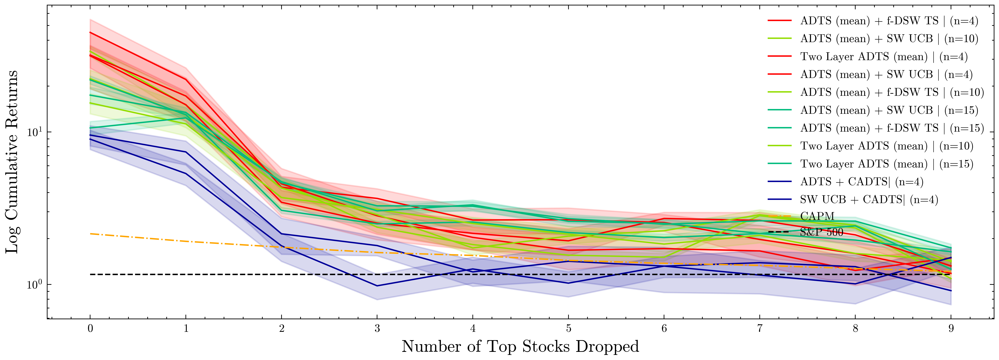

ADTS (mean) + f-DSW TS (n=4) & 1.37 & 0.84 & 0.6 & 56.2\%  \\
ADTS (mean) + SW UCB (n=10) & 1.41 & 0.71 & 0.59 & 57.8\%  \\
Two Stage ADTS (mean) (n=4) & 1.34 & 0.67 & 0.69 & 48.5\%  \\
ADTS (mean) + SW UCB (n=4) & 1.33 & 0.74 & 0.65 & 50.6\%  \\
ADTS (mean) + f-DSW TS (n=10) & 1.35 & 0.79 & 0.68 & 49.5\%  \\
ADTS (mean) + SW UCB (n=15) & 1.25 & 0.85 & 0.76 & 39.0\%  \\
ADTS (mean) + f-DSW TS (n=15) & 1.24 & 0.93 & 0.78 & 36.7\%  \\
Two Stage ADTS (mean) (n=10) & 1.28 & 0.78 & 0.68 & 46.9\%  \\
Two Stage ADTS (mean) (n=15) & 1.15 & 0.89 & 0.64 & 43.8\%  \\
ADTS + CADTS| (n=4) & 1.13 & 0.64 & 0.68 & 39.5\%  \\
SW UCB + CADTS| (n=4) & 1.12 & 0.55 & 0.52 & 54.2\%  \\
CAPM & 0.87 & 0.73 & 0.67 & 22.6\%  \\
S&P 500 & 0.66 & 0.66 & 0.66 & 0.0\%  \\


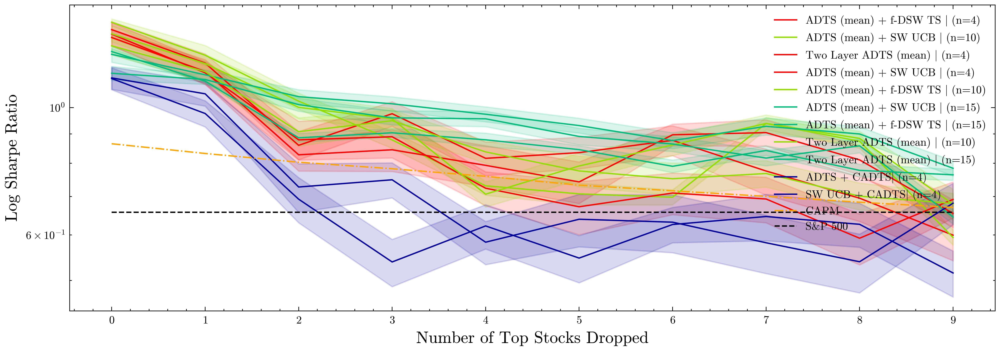

ADTS (mean) + f-DSW TS (n=4) & -12.62 & 0.92 & 0.56 & 104.4\%  \\
ADTS (mean) + SW UCB (n=10) & 7.15 & 0.57 & 0.72 & 89.9\%  \\
Two Stage ADTS (mean) (n=4) & 7.59 & 0.75 & 0.58 & 92.30000000000001\%  \\
ADTS (mean) + SW UCB (n=4) & 8.73 & 0.58 & 0.55 & 93.7\%  \\
ADTS (mean) + f-DSW TS (n=10) & 5.26 & 0.65 & 0.83 & 84.2\%  \\
ADTS (mean) + SW UCB (n=15) & 6.52 & 0.64 & 0.66 & 89.9\%  \\
ADTS (mean) + f-DSW TS (n=15) & 5.32 & 0.73 & 0.66 & 87.6\%  \\
Two Stage ADTS (mean) (n=10) & 3.66 & 0.66 & 0.69 & 81.10000000000001\%  \\
Two Stage ADTS (mean) (n=15) & 3.18 & 0.63 & 0.5 & 84.2\%  \\
ADTS + CADTS| (n=4) & 2.03 & 0.54 & 0.42 & 79.5\%  \\
SW UCB + CADTS| (n=4) & 2.18 & 0.48 & 0.53 & 75.8\%  \\
CAPM & 0.75 & 0.56 & 0.51 & 32.6\%  \\
S&P 500 & 0.45 & 0.45 & 0.45 & 0.0\%  \\


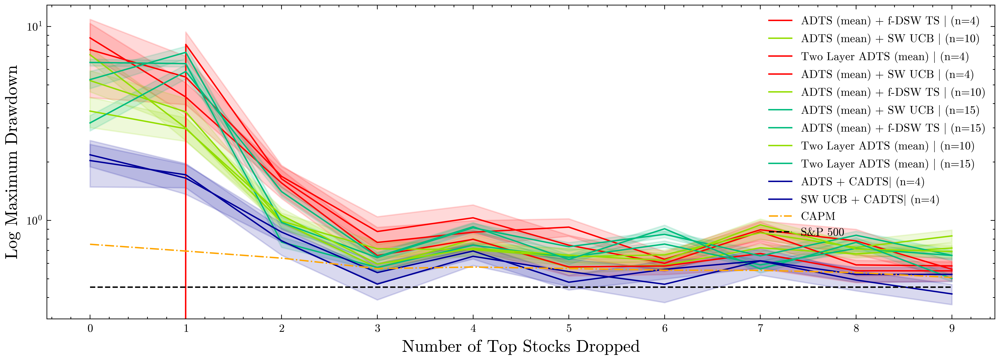

ADTS (mean) + f-DSW TS (n=4) & 0.03 & 0.02 & 0.01 & 52.6\%  \\
ADTS (mean) + SW UCB (n=10) & 0.03 & 0.01 & 0.01 & 48.6\%  \\
Two Stage ADTS (mean) (n=4) & 0.03 & 0.02 & 0.01 & 49.4\%  \\
ADTS (mean) + SW UCB (n=4) & 0.03 & 0.02 & 0.01 & 51.1\%  \\
ADTS (mean) + f-DSW TS (n=10) & 0.02 & 0.02 & 0.01 & 43.5\%  \\
ADTS (mean) + SW UCB (n=15) & 0.03 & 0.01 & 0.01 & 51.300000000000004\%  \\
ADTS (mean) + f-DSW TS (n=15) & 0.03 & 0.01 & 0.01 & 47.199999999999996\%  \\
Two Stage ADTS (mean) (n=10) & 0.02 & 0.02 & 0.01 & 38.6\%  \\
Two Stage ADTS (mean) (n=15) & 0.02 & 0.01 & 0.01 & 40.2\%  \\
ADTS + CADTS| (n=4) & 0.02 & 0.02 & 0.01 & 34.699999999999996\%  \\
SW UCB + CADTS| (n=4) & 0.02 & 0.01 & 0.01 & 32.9\%  \\
CAPM & 0.01 & 0.01 & 0.01 & 7.9\%  \\
S&P 500 & 0.01 & 0.01 & 0.01 & 0.0\%  \\


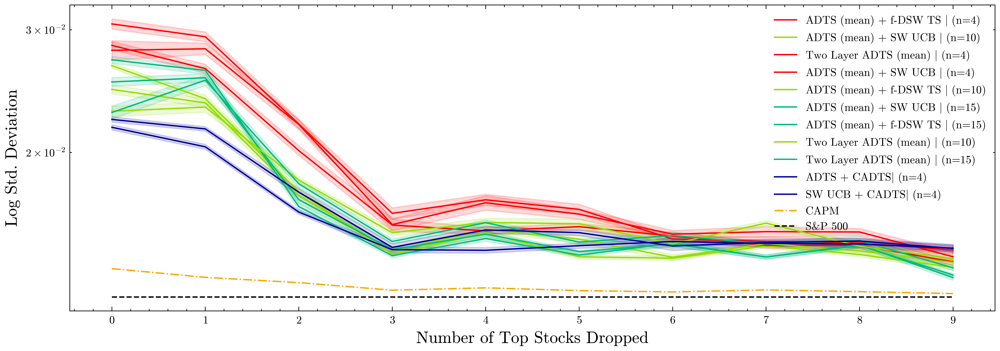

In [139]:
with plt.style.context(['science', 'ieee', 'no-latex']):
    methodologies_dict = {}
    for i, (k, v) in enumerate(robustness_dict.items()):
        df_results = v["df_results"]
        for j in range(len(df_results)):
            methodology = df_results.index[j]
            for col in df_results.columns:
                if col not in methodologies_dict.keys():
                    methodologies_dict[col] = {
                        methodology: [df_results.loc[methodology, col]]
                    }
                else:
                    if methodology not in methodologies_dict[col].keys():
                        methodologies_dict[col][methodology] = [abs(df_results.loc[methodology, col])]
                    else:
                        methodologies_dict[col][methodology].append(abs(df_results.loc[methodology, col]))

    for kpi in methodologies_dict.keys():
        fig, ax = plt.subplots(figsize=(12, 4))
        for i, (methodology, values) in enumerate(methodologies_dict[kpi].items()):
            if methodology in display_results_dict.keys():
                print(methodology.replace(" | ", " "), "&", round(values[0], 2), 
                      "&", round(values[5], 2), "&", round(values[-1], 2), "&", 
                      str(round(1-values[-1] / values[0], 3)*100) + "\% ", "\\\\")
                plt.plot(
                    values, 
                    label=methodology.replace("|", "$|$").replace("Stage", "Layer").replace("RF-DSW TS", "ADTS"), 
                    color=display_results_dict[methodology]["color"],
                    linestyle=display_results_dict[methodology]["linestyle"]
                )
                if methodology in inverted_dict[kpi].keys():
                    kpi_matrix = np.zeros(shape=(len(inverted_dict[kpi][methodology].keys()), len(inverted_dict[kpi][methodology][0])))
                    for j in inverted_dict[kpi][methodology].keys():
                        kpi_matrix[j, :] = inverted_dict[kpi][methodology][j]
                    confidence_interval = 1.96 * kpi_matrix.std(axis=1) / np.sqrt(kpi_matrix.shape[1])
#                     print(kpi_matrix.shape)
                    upper = (values + confidence_interval)
                    lower = (values - confidence_interval)
                    plt.fill_between(list(range(len(kpi_matrix))), upper, lower, color=display_results_dict[methodology]["color"], alpha=0.15, label='_nolegend_')
        plt.ylabel(f"Log {kpi}", fontsize=12)
        plt.xlabel("Number of Top Stocks Dropped", fontsize=12)
        plt.xticks(np.arange(0, 10))
        plt.yscale('log')
        plt.legend(loc="upper right", fontsize=8)
        # plt.savefig(f'portfolio_robustness_analysis_{kpi}.jpg', dpi=600)
        plt.show()